In [5]:
from pycaret.classification import *
import pandas as pd
import os
import seaborn as sns
import matplotlib.pyplot as plt
os.chdir('/home/antoine/gene_pheno_pred')


In [6]:
# Load training set
train = pd.read_csv('//home/antoine/gene_pheno_pred/models/ComplEx_2023-05-27 20:08:45.227169_kg_train.csv' , header=0)
test = pd.read_csv('/home/antoine/gene_pheno_pred/models/ComplEx_2023-05-27 20:08:45.227169_kg_test.csv' , header=0)

# add column to identify train, test and val
train['set'] = 'train'
test['set'] = 'test'

# Merge train, test and val
df = pd.concat([train, test], axis=0)
df = df[~(df['relation'] == 'no_link_known')] # Drop negatives
df

,0,1,2,3,4,5,6,7,8,9,...,194,195,196,197,198,199,head,relation,tail,set
0,-0.046983,-0.013739,0.042602,0.048736,0.043750,0.013219,0.036165,0.046175,0.045315,-0.038804,...,0.037187,0.047306,0.152032,0.127002,-0.170383,-0.048178,https://wormbase.org/wbdata/pheno-419244,http://www.semanticweb.org/needed-terms#001,https://wormbase.org/species/c_elegans/gene/WB...,train
2,-0.062714,-0.046944,-0.003344,0.064870,0.043218,0.050744,0.020802,0.065952,0.046233,-0.025984,...,0.312158,-0.314862,-0.305022,0.301996,0.311502,0.295692,https://wormbase.org/wbinter/000550913,http://semanticscience.org/resource/SIO_000628,http://semanticscience.org/resource/SIO_010043,train
3,-0.036769,-0.050530,0.022724,0.043481,0.041065,-0.027905,0.048080,0.047706,0.006531,0.052103,...,-0.197611,0.210941,-0.221397,0.177444,-0.183186,-0.175382,https://wormbase.org/wbdata/pheno-29352,http://www.semanticweb.org/needed-terms#001,https://wormbase.org/species/c_elegans/gene/WB...,train
4,-0.043939,-0.019298,0.032994,0.052776,0.022629,0.040683,0.018780,-0.007267,0.009522,0.015316,...,0.473943,-0.413582,-0.477105,-0.485538,-0.480503,0.514484,https://wormbase.org/wbdata/pheno-406438,http://semanticscience.org/resource/SIO_001279,https://wormbase.org/species/all/phenotype/WBP...,train
5,-0.026500,-0.049129,0.030705,0.040607,0.044516,-0.022275,0.021410,0.041271,0.034471,-0.039213,...,-0.089732,0.176532,-0.177958,-0.008136,-0.186448,-0.072193,https://wormbase.org/wbdata/pheno-157349,http://www.semanticweb.org/needed-terms#001,https://wormbase.org/species/c_elegans/gene/WB...,train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
469365,0.111279,0.089259,-0.094536,0.070284,-0.091275,0.086319,-0.095893,0.076899,-0.105158,0.111245,...,0.021843,-0.022982,0.013403,-0.001441,0.045997,0.004828,https://wormbase.org/species/c_elegans/gene/WB...,http://www.w3.org/1999/02/22-rdf-syntax-ns#type,http://semanticscience.org/resource/SIO_000985,test
469367,-0.017618,-0.008766,-0.048096,0.018502,0.004573,-0.004762,-0.050887,0.015212,-0.030709,0.002636,...,0.021843,-0.022982,0.013403,-0.001441,0.045997,0.004828,https://wormbase.org/species/c_elegans/gene/WB...,http://www.w3.org/1999/02/22-rdf-syntax-ns#type,http://semanticscience.org/resource/SIO_000985,test
469370,-0.050200,-0.017306,0.034940,0.051345,-0.033794,0.043038,0.013062,-0.011356,0.029784,-0.031038,...,0.012510,0.008696,-0.004696,-0.014143,0.029434,-0.018840,https://wormbase.org/wbinter/000538981,http://semanticscience.org/resource/SIO_000628,http://semanticscience.org/resource/SIO_010043,test
469371,-0.044240,-0.040704,-0.038273,0.039763,0.023383,0.049980,-0.019116,0.043720,0.018882,-0.027082,...,0.008387,-0.005385,0.007089,-0.016538,0.009980,-0.008785,https://wormbase.org/wbdata/pheno-407861,http://semanticscience.org/resource/SIO_001279,https://wormbase.org/species/all/phenotype/WBP...,test


In [9]:
# split combined embeddings into individual nodes
df1 = df.iloc[:, :100] # Head node
df2 = df.iloc[:, 100:200] # Tail node

# Add column to identify head and tail node
df1['node'] = df['head']
df2['node'] = df['tail']
df1['set'] = df['set']
df2['set'] = df['set']

# drop indexes
df1 = df1.reset_index(drop=True)
df2 = df2.reset_index(drop=True)

# rename columns of df2 to be the same as df1
df2.columns = df1.columns

# merge the two dataframes
df = pd.concat([df1, df2], axis=0)

# Count the number of times a node appears in the dataset and add the count as a column
df['connectivity'] = df.groupby('node')['node'].transform('count')
df = df.sample(frac=1)  # Shuffle the DataFrame

# Reset the index of the shuffled DataFrame
df = df.reset_index(drop=True)
df = df.drop_duplicates(subset=['node'])
df

,0,1,2,3,4,5,6,7,8,9,...,93,94,95,96,97,98,99,node,set,connectivity
0,0.488152,-0.485796,-0.528505,-0.557085,-0.496258,-0.515975,-0.478177,-0.369928,-0.216842,-0.486434,...,0.349266,0.476863,-0.516907,0.357032,-0.511963,-0.500753,0.528915,https://wormbase.org/species/all/phenotype/WBP...,train,41635
1,0.042302,0.036256,-0.046137,0.027964,-0.035342,0.035771,0.029384,0.050530,-0.008855,-0.000857,...,0.046778,-0.014332,0.044435,0.035875,-0.032031,0.043326,0.046931,ceh-33,train,1
2,0.152620,-0.123690,-0.160371,-0.131780,0.104793,-0.138482,-0.110596,0.070120,-0.087901,0.015579,...,0.004336,0.127084,0.101279,0.198223,-0.114477,0.157230,-0.160378,https://wormbase.org/species/all/phenotype/WBP...,train,44
3,-0.033806,-0.030565,0.049420,0.044569,-0.038999,-0.038355,-0.052249,0.043973,0.035383,0.035265,...,0.039241,-0.032635,-0.017556,-0.039134,0.032586,0.046048,-0.047594,https://wormbase.org/wbdata/dev-13002,train,3
4,0.010983,-0.042625,0.027377,0.039525,-0.046176,-0.033328,0.028145,0.061168,-0.052685,0.060284,...,0.049851,-0.040607,-0.043681,0.050520,0.056084,0.057047,-0.052265,https://wormbase.org/wbdata/dev-73569,train,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2831961,-0.025781,0.012058,0.033951,0.019422,0.009485,-0.017458,0.017218,0.017286,-0.002004,0.016568,...,-0.006922,0.024013,-0.000199,0.017040,-0.006495,0.025863,-0.027810,21ur-10220,train,1
2832036,-0.044878,0.031513,0.025460,0.029083,0.013241,-0.006382,0.011698,-0.000756,0.004261,0.040932,...,-0.011427,0.035587,-0.033330,-0.007697,-0.000256,0.040833,-0.003297,21ur-10864,train,1
2832083,-0.016588,0.029338,0.023196,0.008959,0.027703,-0.002850,0.021197,0.014118,0.001468,-0.002487,...,0.002124,0.008079,-0.009003,-0.012863,-0.016991,0.025055,-0.011168,21ur-3554,train,1
2832154,-0.016804,-0.016886,0.020045,0.027947,0.005943,-0.005137,-0.003801,0.005085,-0.010625,0.027928,...,0.018959,0.024958,-0.006844,0.015035,0.003711,0.009933,0.005351,srh-155,train,1


In [10]:
# Select only embeddings
df_tsne_num = df.iloc[:, :100]

# Apply TSNE
import numpy as np
import pandas as pd
# Import TSNE
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

In [11]:
tsne = TSNE(n_components=2)  # Specify the number of components you want to keep
tsne_result = tsne.fit_transform(df_tsne_num)
df_tsne = pd.DataFrame(data=tsne_result, columns=['TSNE1', 'TSNE2'])

In [12]:
# transform embedding into dataframe
df_tsne.columns = ['TSNE1', 'TSNE2']

df_tsne.reset_index(drop=True, inplace=True)
df.reset_index(drop=True, inplace=True)

df_tsne['node'] = df['node']
df_tsne['set'] = df['set']
df_tsne['connectivity'] = df['connectivity']

# Create a new column with the merged string excluding the last index
df_tsne['node_type'] = df_tsne['node'].apply(lambda x: '/'.join(x[:-1]))
df_tsne['node_type'] = df_tsne['node'].replace('', 'labels')

# Define the ranges and labels for the connectivity groups
ranges = [0, 1, 2, 3, 4, 10, 100, 1000, 10000, float('inf')]
labels = ['1', '2', '3', '4', '5-10', '11-100', '101-1000', '1001-10000', '10001+']

# Create the 'grouped_connectivity' column
df_tsne['grouped_connectivity'] = pd.cut(df_tsne['connectivity'], bins=ranges, labels=labels, right=True)

# Function to replace the column values
def replace_url(url):
    parts = url.split('-')
    if len(parts) > 1:
        url = url.replace('-' + parts[-1], '')
        if 'https' in url:
            return url
        else:
            return ''
    else:
        return '/'.join(url.split('/')[:-1])

# Create a new column with the merged string excluding the last index
df_tsne['node_type'] = df_tsne['node_type'].apply(replace_url)
df_tsne['node_type'] = df_tsne['node_type'].replace('', 'labels')

print(df_tsne['node_type'].unique())

# Define the dictionary mapping
replacement_dict = {
    'https://wormbase.org/wbdata/ortho_dis': 'Ortholog disease',
    'https://wormbase.org/wbdata/pheno': 'Phenotype Annotation',
    'https://wormbase.org/wbinter': 'Interaction Annotation',
    'https://wormbase.org/wbdata/dis': 'Disease Annotation',
    'https://disease': 'Disease',
    'https://wormbase.org/search/life_stage': 'Life Stage',
    'https://wormbase.org/species/c_elegans/gene': 'Molecular Entity',
    'https://wormbase.org/species/all/phenotype': 'Phenotype',
    'https://wormbase.org/wbdata/dev': 'Development Annotation',

    'http://semanticscience.org/resource': 'Mol. Entity Type',
    'https://wormbase.org/species/all/expr_pattern': 'Expression Pattern',

    'labels': 'Labels'
}

# Replace instances in 'node_type' column
df_tsne['node_type'] = df_tsne['node_type'].replace(replacement_dict)

df_tsne = df_tsne.sample(frac=1)  # Shuffle the DataFrame

# Reset the index of the shuffled DataFrame
df_tsne = df_tsne.reset_index(drop=True)

grouped = df_tsne.groupby('set')

df_tsne

['https://wormbase.org/species/all/phenotype' 'labels'
 'https://wormbase.org/wbdata/dev' 'https://wormbase.org/wbdata/pheno'
 'https://wormbase.org/wbinter'
 'https://wormbase.org/species/c_elegans/gene'
 'http://semanticscience.org/resource' 'https://disease'
 'https://wormbase.org/search/life_stage'
 'https://wormbase.org/species/all/expr_pattern'
 'https://wormbase.org/wbdata/ortho_dis' 'https://wormbase.org/wbdata/dis']


,TSNE1,TSNE2,node,set,connectivity,node_type,grouped_connectivity
0,13.631185,104.237900,https://wormbase.org/species/c_elegans/gene/WB...,train,2,Molecular Entity,2
1,1.759539,-62.149845,https://wormbase.org/wbdata/pheno-251541,train,2,Phenotype Annotation,2
2,17.153036,70.982826,tat-3,train,1,Labels,1
3,-73.342949,-32.875298,https://wormbase.org/wbinter/000516578,train,3,Interaction Annotation,3
4,-13.066987,64.677231,https://wormbase.org/wbdata/pheno-244903,train,2,Phenotype Annotation,2
...,...,...,...,...,...,...,...
675840,-83.282791,-53.291378,https://wormbase.org/wbinter/000507676,train,3,Interaction Annotation,3
675841,49.163895,-92.985939,https://wormbase.org/wbdata/pheno-111163,train,2,Phenotype Annotation,2
675842,61.747665,-32.939960,https://wormbase.org/wbdata/pheno-271902,train,2,Phenotype Annotation,2
675843,45.725601,-82.398521,https://wormbase.org/wbdata/pheno-129435,train,2,Phenotype Annotation,2


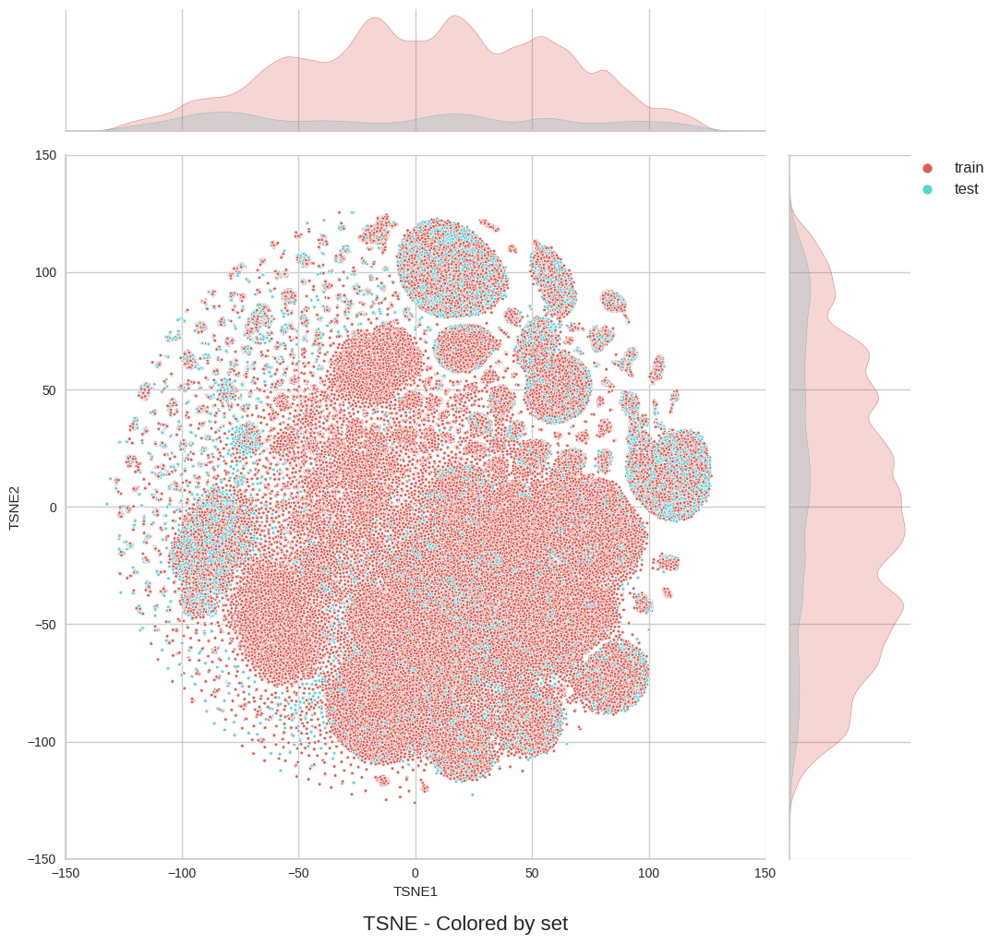

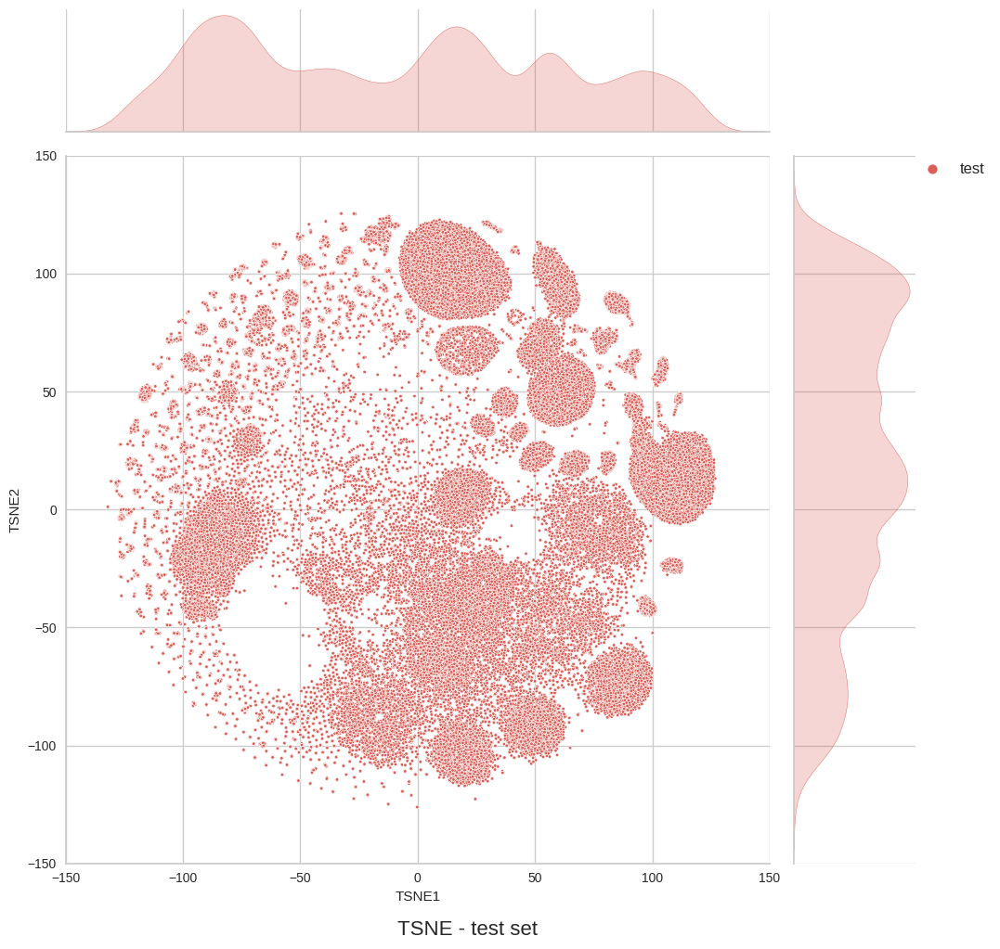

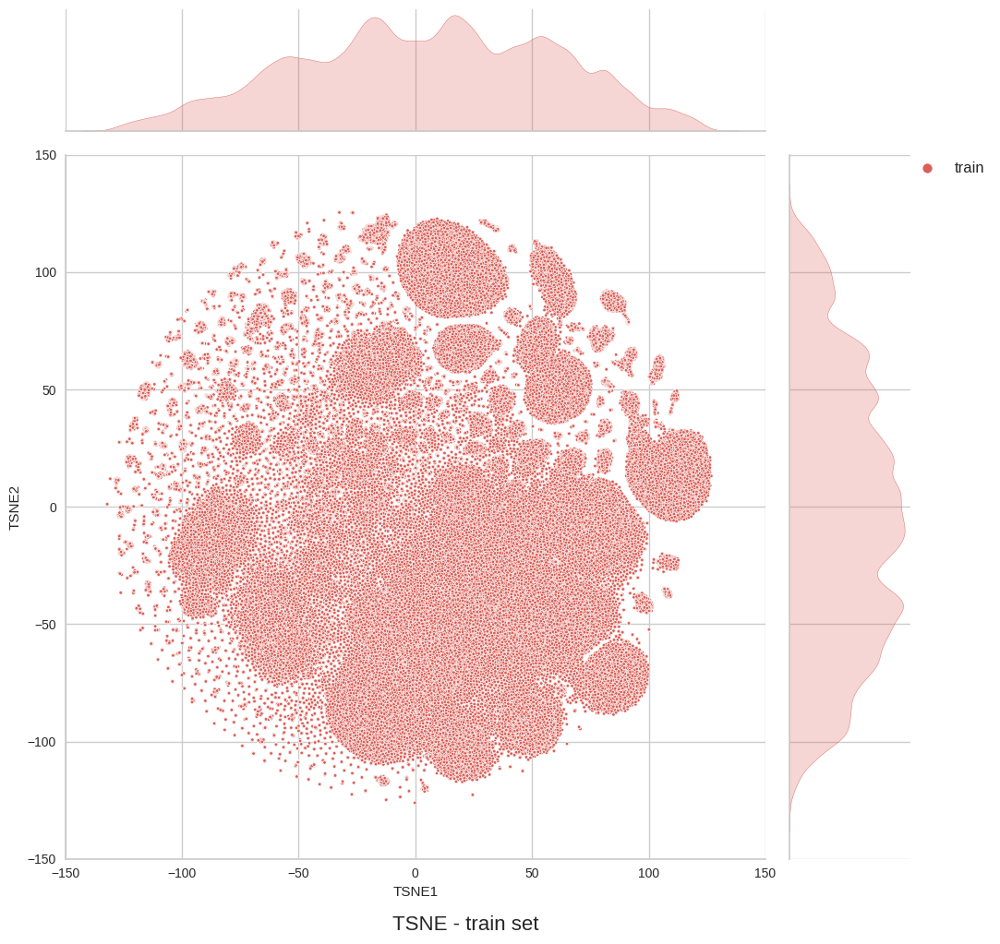

In [13]:
g = sns.jointplot(data=df_tsne, x='TSNE1', y='TSNE2', hue='set', palette='hls', height=10, ratio=5, marker=".", s=25)
g.set_axis_labels('TSNE1', 'TSNE2')

# Set xlim and ylim
g.ax_joint.set_xlim(-150, 150)
g.ax_joint.set_ylim(-150, 150)

# Legend outside the plot
plt.legend(bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0., prop={'size': 12})
g.fig.suptitle('TSNE - Colored by set', y=0.0, fontsize=16)
plt.show()

# Access each group separately
for group_name, group_data in grouped:
    g = sns.jointplot(data=group_data, x='TSNE1', y='TSNE2', hue='set', palette='hls', height=10, ratio=5, marker=".", s=25)
    g.set_axis_labels('TSNE1', 'TSNE2')

    # Set xlim and ylim
    g.ax_joint.set_xlim(-150, 150)
    g.ax_joint.set_ylim(-150, 150)
    
    # Legend outside the plot
    plt.legend(bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0., prop={'size': 12})
    g.fig.suptitle('TSNE - ' + group_name + ' set', y=0.0, fontsize=16)

    plt.show()

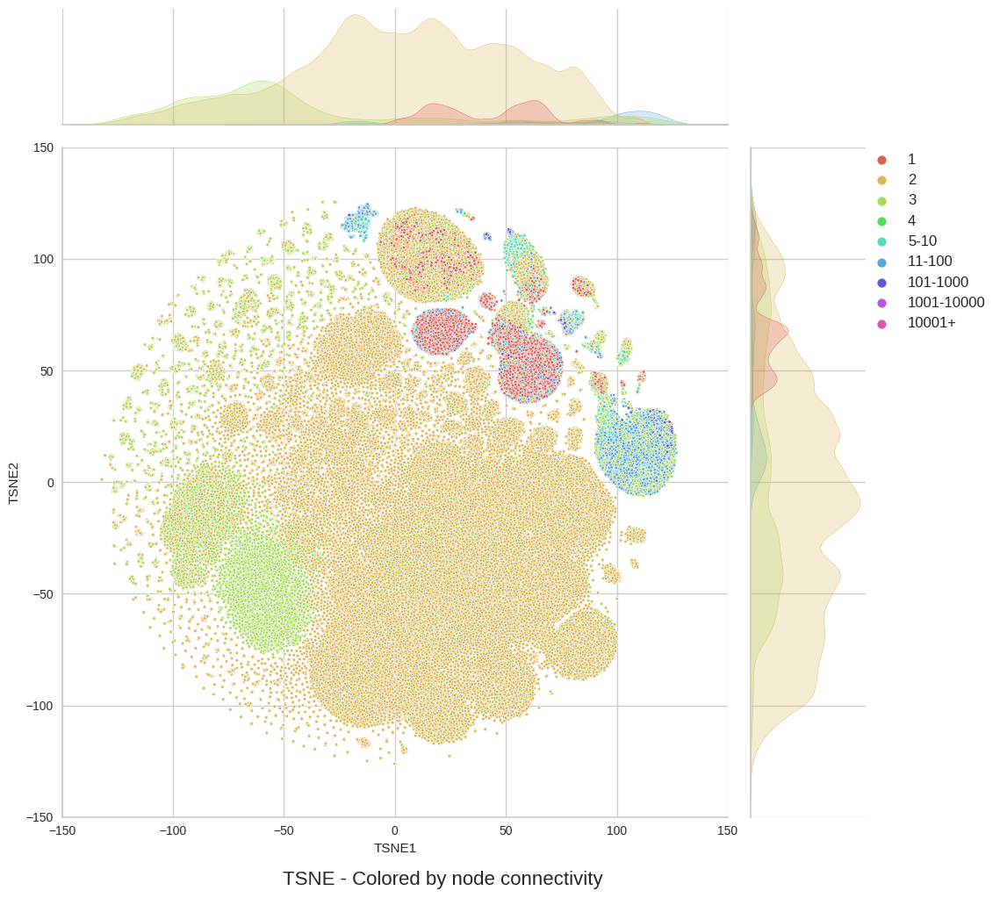

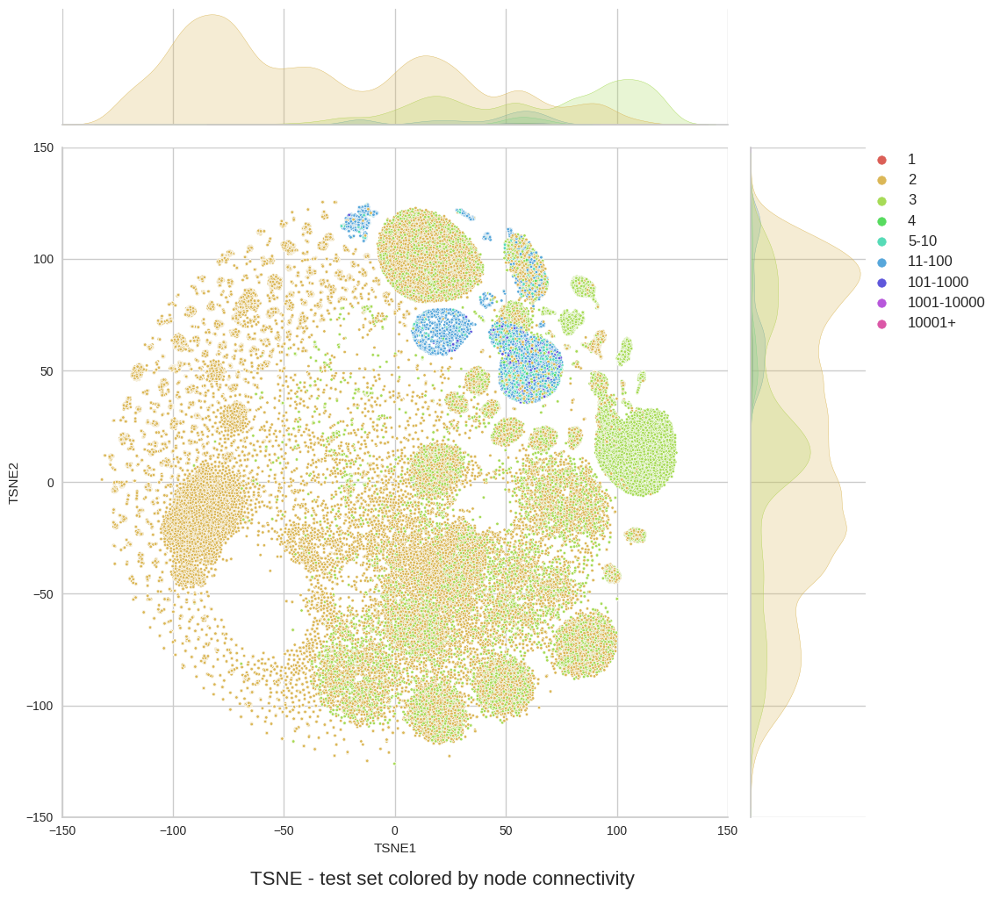

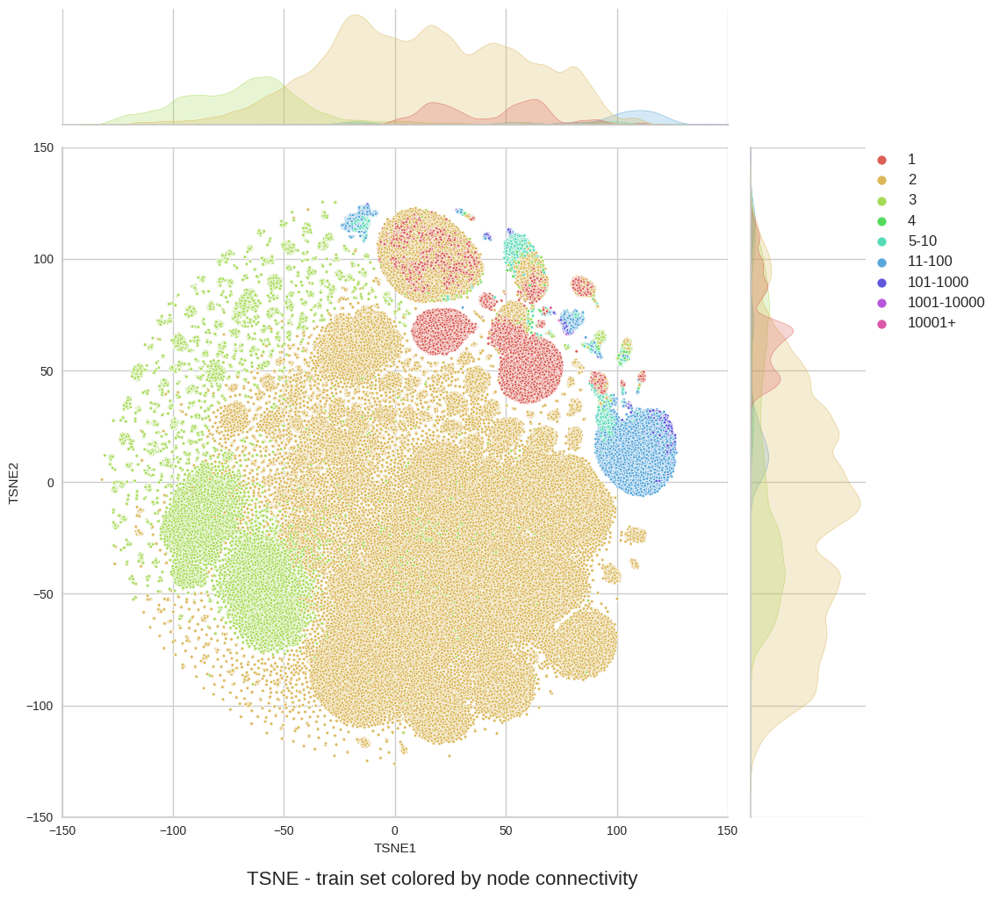

In [14]:
g = sns.jointplot(data=df_tsne, x='TSNE1', y='TSNE2', hue='grouped_connectivity', palette='hls', height=10, ratio=5, marker=".", s=25)
g.set_axis_labels('TSNE1', 'TSNE2')

# Set xlim and ylim
g.ax_joint.set_xlim(-150, 150)
g.ax_joint.set_ylim(-150, 150)

# Legend outside the plot
plt.legend(bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0., prop={'size': 12})
g.fig.suptitle('TSNE - Colored by node connectivity', y=0.0, fontsize=16)
plt.show()

# Access each group separately
for group_name, group_data in grouped:
    g = sns.jointplot(data=group_data, x='TSNE1', y='TSNE2', hue='grouped_connectivity', palette='hls', height=10, ratio=5, marker=".", s=25)
    g.set_axis_labels('TSNE1', 'TSNE2')

    # Set xlim and ylim
    g.ax_joint.set_xlim(-150, 150)
    g.ax_joint.set_ylim(-150, 150)
    
    # Legend outside the plot
    plt.legend(bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0., prop={'size': 12})
    g.fig.suptitle('TSNE - ' + group_name + ' set colored by node connectivity', y=0.0, fontsize=16)

    plt.show()

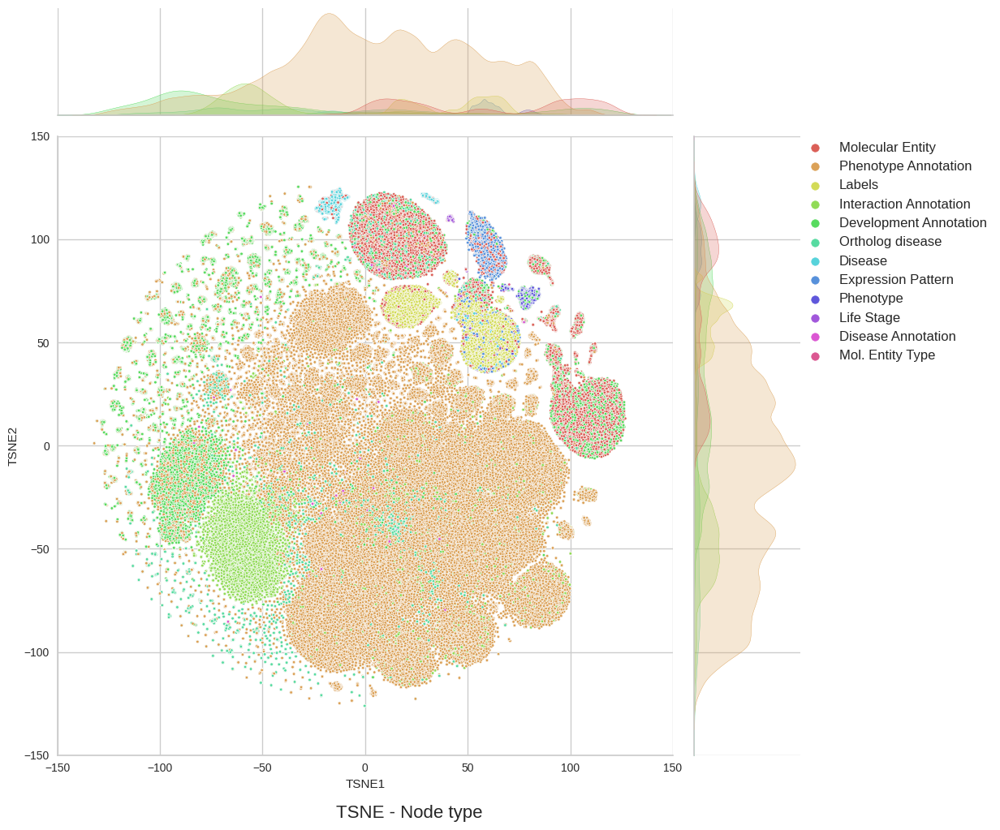

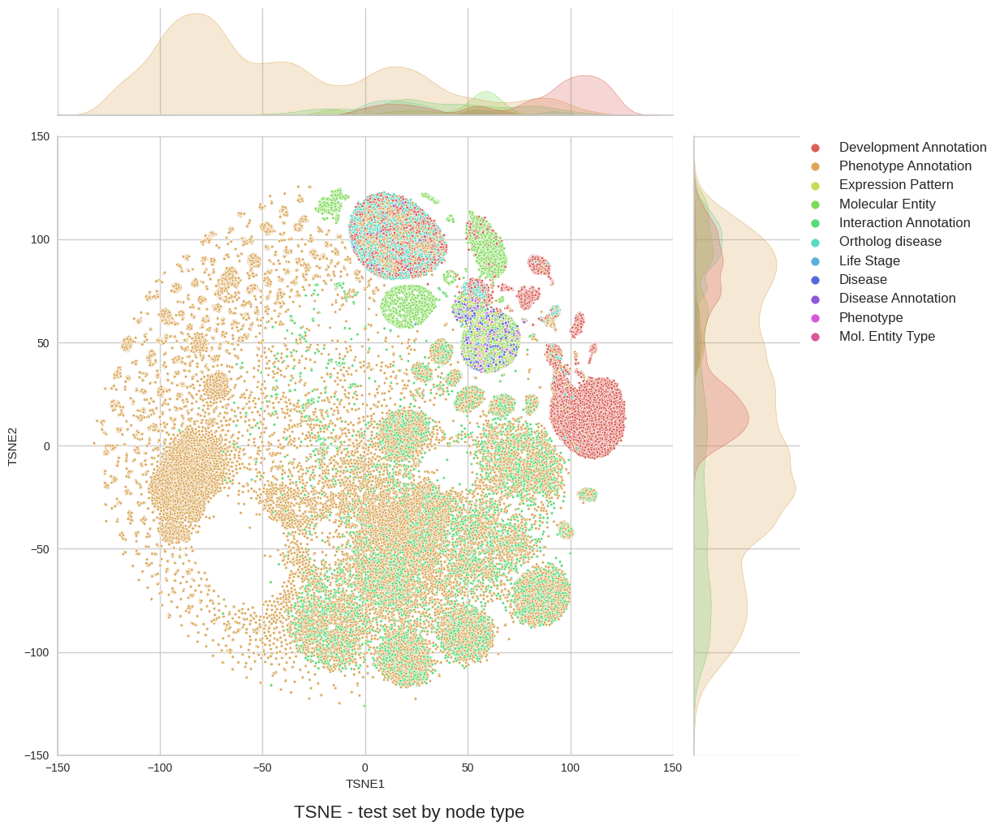

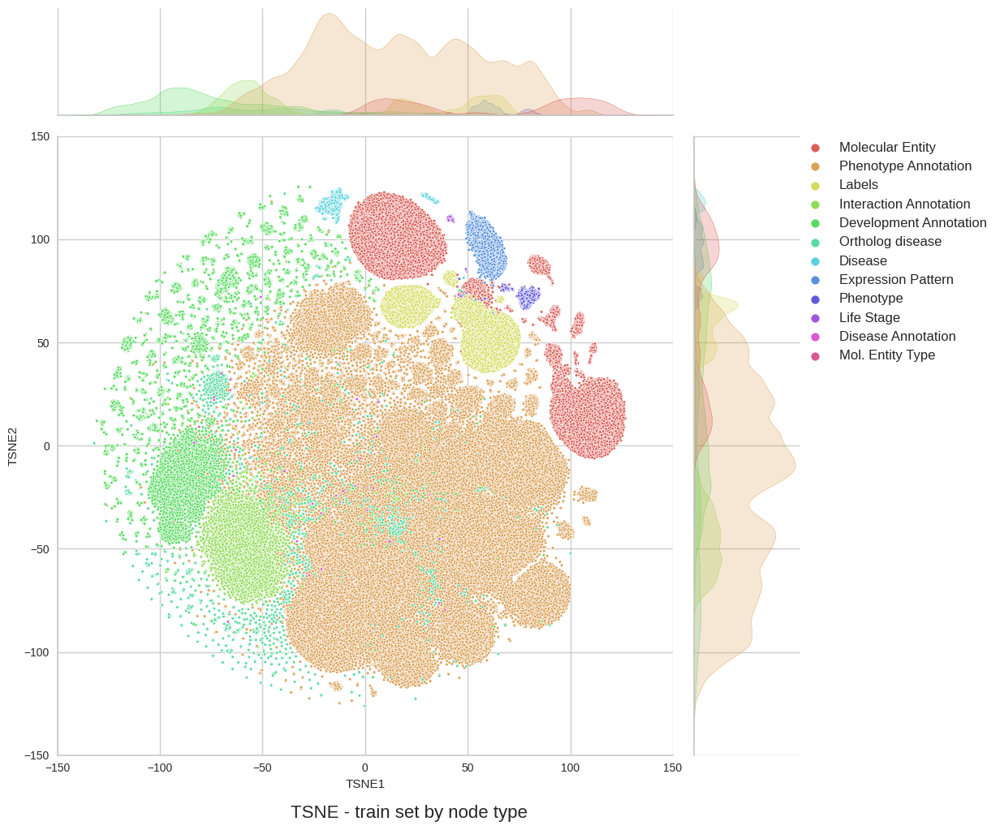

In [15]:
g = sns.jointplot(data=df_tsne, x='TSNE1', y='TSNE2', hue='node_type', palette='hls', height=10, ratio=5, marker=".", s=25)
g.set_axis_labels('TSNE1', 'TSNE2')

# Set xlim and ylim
g.ax_joint.set_xlim(-150, 150)
g.ax_joint.set_ylim(-150, 150)

# Legend outside the plot
plt.legend(bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0., prop={'size': 12})
g.fig.suptitle('TSNE - Node type', y=0.0, fontsize=16)
plt.show()

# Access each group separately
for group_name, group_data in grouped:
    g = sns.jointplot(data=group_data, x='TSNE1', y='TSNE2', hue='node_type', palette='hls', height=10, ratio=5, marker=".", s=25)
    g.set_axis_labels('TSNE1', 'TSNE2')

    # Set xlim and ylim
    g.ax_joint.set_xlim(-150, 150)
    g.ax_joint.set_ylim(-150, 150)
    
    # Legend outside the plot
    plt.legend(bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0., prop={'size': 12})
    g.fig.suptitle('TSNE - ' + group_name + ' set by node type', y=0.0, fontsize=16)

    plt.show()

In [16]:
for group_name, group_data in grouped:
    print(group_data['node_type'].value_counts())



Phenotype Annotation      69208
Development Annotation    14017
Interaction Annotation     8826
Molecular Entity           4670
Ortholog disease           4489
Expression Pattern         1004
Disease                     752
Phenotype                   457
Disease Annotation          188
Life Stage                   98
Mol. Entity Type              2
Name: node_type, dtype: int64
Phenotype Annotation      363671
Development Annotation     60141
Molecular Entity           44519
Interaction Annotation     37940
Labels                     28694
Ortholog disease           24010
Expression Pattern          6392
Disease                     3467
Phenotype                   1951
Disease Annotation           883
Life Stage                   456
Mol. Entity Type              10
Name: node_type, dtype: int64


In [17]:
# merge the two dataframes
dfy = pd.concat([df1, df2], axis=0)

# Count the number of times a node appears in the dataset and add the count as a column
dfy['connectivity'] = dfy.groupby('node')['node'].transform('count')

dfy

,0,1,2,3,4,5,6,7,8,9,...,93,94,95,96,97,98,99,node,set,connectivity
0,-0.046983,-0.013739,0.042602,0.048736,0.043750,0.013219,0.036165,0.046175,0.045315,-0.038804,...,0.045551,0.053199,-0.035328,-0.041737,0.043098,0.054381,-0.032216,https://wormbase.org/wbdata/pheno-419244,train,2
1,-0.062714,-0.046944,-0.003344,0.064870,0.043218,0.050744,0.020802,0.065952,0.046233,-0.025984,...,0.072564,-0.028600,-0.061493,0.061454,0.057226,0.064174,-0.067347,https://wormbase.org/wbinter/000550913,train,3
2,-0.036769,-0.050530,0.022724,0.043481,0.041065,-0.027905,0.048080,0.047706,0.006531,0.052103,...,0.050478,-0.010378,-0.016124,0.051107,0.029965,0.044770,0.004296,https://wormbase.org/wbdata/pheno-29352,train,2
3,-0.043939,-0.019298,0.032994,0.052776,0.022629,0.040683,0.018780,-0.007267,0.009522,0.015316,...,0.044167,-0.027372,0.018232,-0.012368,0.039810,0.046492,0.017296,https://wormbase.org/wbdata/pheno-406438,train,2
4,-0.026500,-0.049129,0.030705,0.040607,0.044516,-0.022275,0.021410,0.041271,0.034471,-0.039213,...,0.037322,-0.035610,-0.039872,0.040126,0.043436,0.046242,-0.039240,https://wormbase.org/wbdata/pheno-157349,train,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1416263,0.001484,0.036918,0.022707,0.028065,0.013042,0.004819,0.027402,0.043798,-0.017326,-0.017400,...,0.025969,0.021843,-0.022982,0.013403,-0.001441,0.045997,0.004828,http://semanticscience.org/resource/SIO_000985,test,19981
1416264,0.001484,0.036918,0.022707,0.028065,0.013042,0.004819,0.027402,0.043798,-0.017326,-0.017400,...,0.025969,0.021843,-0.022982,0.013403,-0.001441,0.045997,0.004828,http://semanticscience.org/resource/SIO_000985,test,19981
1416265,-0.028770,0.023575,-0.005842,0.030836,0.032731,0.009073,0.017299,0.014034,-0.005827,0.017251,...,-0.010972,0.012510,0.008696,-0.004696,-0.014143,0.029434,-0.018840,http://semanticscience.org/resource/SIO_010043,test,46301
1416266,-0.006684,0.010077,0.013734,0.020853,0.009272,0.004437,-0.000192,0.014841,-0.015201,0.016707,...,-0.004018,0.008387,-0.005385,0.007089,-0.016538,0.009980,-0.008785,https://wormbase.org/species/all/phenotype/WBP...,test,3725


In [20]:
df_tsnex = df_tsne
df_tsnex

,TSNE1,TSNE2,node,set,connectivity,node_type,grouped_connectivity
0,13.631185,104.237900,https://wormbase.org/species/c_elegans/gene/WB...,train,2,Molecular Entity,2
1,1.759539,-62.149845,https://wormbase.org/wbdata/pheno-251541,train,2,Phenotype Annotation,2
2,17.153036,70.982826,tat-3,train,1,Labels,1
3,-73.342949,-32.875298,https://wormbase.org/wbinter/000516578,train,3,Interaction Annotation,3
4,-13.066987,64.677231,https://wormbase.org/wbdata/pheno-244903,train,2,Phenotype Annotation,2
...,...,...,...,...,...,...,...
675840,-83.282791,-53.291378,https://wormbase.org/wbinter/000507676,train,3,Interaction Annotation,3
675841,49.163895,-92.985939,https://wormbase.org/wbdata/pheno-111163,train,2,Phenotype Annotation,2
675842,61.747665,-32.939960,https://wormbase.org/wbdata/pheno-271902,train,2,Phenotype Annotation,2
675843,45.725601,-82.398521,https://wormbase.org/wbdata/pheno-129435,train,2,Phenotype Annotation,2


In [21]:
merged_df = pd.merge(dfy, df_tsnex[['node', 'TSNE1', 'TSNE2']], on='node')
merged_df

,0,1,2,3,4,5,6,7,8,9,...,95,96,97,98,99,node,set,connectivity,TSNE1,TSNE2
0,-0.046983,-0.013739,0.042602,0.048736,0.043750,0.013219,0.036165,0.046175,0.045315,-0.038804,...,-0.035328,-0.041737,0.043098,0.054381,-0.032216,https://wormbase.org/wbdata/pheno-419244,train,2,-61.476906,24.803076
1,-0.046983,-0.013739,0.042602,0.048736,0.043750,0.013219,0.036165,0.046175,0.045315,-0.038804,...,-0.035328,-0.041737,0.043098,0.054381,-0.032216,https://wormbase.org/wbdata/pheno-419244,train,2,-61.476906,24.803076
2,-0.062714,-0.046944,-0.003344,0.064870,0.043218,0.050744,0.020802,0.065952,0.046233,-0.025984,...,-0.061493,0.061454,0.057226,0.064174,-0.067347,https://wormbase.org/wbinter/000550913,train,3,-59.267445,-57.061474
3,-0.062714,-0.046944,-0.003344,0.064870,0.043218,0.050744,0.020802,0.065952,0.046233,-0.025984,...,-0.061493,0.061454,0.057226,0.064174,-0.067347,https://wormbase.org/wbinter/000550913,train,3,-59.267445,-57.061474
4,-0.062714,-0.046944,-0.003344,0.064870,0.043218,0.050744,0.020802,0.065952,0.046233,-0.025984,...,-0.061493,0.061454,0.057226,0.064174,-0.067347,https://wormbase.org/wbinter/000550913,train,3,-59.267445,-57.061474
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2832531,-0.005295,0.017525,0.009631,0.031049,0.009865,-0.002026,0.014458,0.020806,-0.019636,0.000684,...,-0.009126,0.003725,-0.007155,0.029593,-0.010257,21ur-10261,train,1,67.688499,47.907036
2832532,0.038526,0.013062,0.035903,-0.009963,-0.031024,0.004649,0.018973,0.033536,-0.009709,0.005886,...,0.009486,-0.017289,-0.034279,0.023502,0.032876,aipr-1,train,1,23.489475,74.476723
2832533,-0.024254,0.032949,0.016074,0.033582,0.030657,0.008059,-0.012001,0.030829,-0.003725,0.005180,...,0.008108,-0.012121,-0.002627,0.024108,-0.013402,21ur-8851,train,1,50.942261,55.650261
2832534,-0.041389,0.028299,0.009788,0.033591,0.018051,-0.034936,0.011177,0.029486,-0.028569,0.020371,...,-0.023617,0.013739,0.003536,0.019701,-0.007769,21ur-8617,train,1,53.092484,42.417839


In [27]:
merged_df = merged_df.sample(frac=1)  # Shuffle the DataFrame

# Reset the index of the shuffled DataFrame
merged_df = merged_df.reset_index(drop=True)
merged_df = merged_df.drop_duplicates()
merged_df = merged_df.reset_index(drop=True)

groupedx = merged_df.groupby('set')
merged_df

,0,1,2,3,4,5,6,7,8,9,...,95,96,97,98,99,node,set,connectivity,TSNE1,TSNE2
0,-0.036147,-0.054260,0.014181,0.049811,0.045205,-0.014460,0.026103,0.042290,0.024968,-0.034048,...,-0.042235,0.030960,0.039084,0.048468,-0.033745,https://wormbase.org/wbdata/pheno-246130,train,2,-20.512716,-41.948444
1,0.139182,-0.054361,-0.027157,-0.210643,0.129174,0.185325,0.160361,-0.219346,0.170100,-0.127032,...,0.194991,-0.191195,-0.066253,-0.223705,0.044304,https://wormbase.org/species/c_elegans/gene/WB...,train,29,117.410263,11.389085
2,0.015131,-0.035300,0.012324,0.037288,0.038489,0.031848,0.038323,0.044763,-0.021196,0.030973,...,-0.036089,0.041636,0.036577,0.042159,-0.038731,https://wormbase.org/wbdata/pheno-299526,train,2,-33.265385,90.507187
3,-0.017265,-0.043196,-0.004264,0.045479,0.030986,-0.000622,0.036340,0.046059,0.003541,-0.033008,...,-0.038479,0.023314,0.038492,0.043260,-0.037106,https://wormbase.org/wbdata/pheno-72898,test,2,5.075097,-106.175514
4,0.142864,-0.054407,-0.049026,-0.110236,0.027506,-0.106785,-0.010025,0.041252,-0.082061,-0.058250,...,0.054778,-0.056212,-0.059518,0.093875,-0.073624,https://wormbase.org/species/all/phenotype/WBP...,train,20,79.524384,71.433365
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
913026,-0.059840,-0.040900,-0.057565,0.026739,-0.033468,0.015239,-0.065392,0.075841,-0.073558,0.063132,...,-0.057467,0.057718,0.057395,0.070995,-0.059455,https://wormbase.org/wbdata/pheno-164362,test,2,-91.522842,22.714653
913027,0.086662,0.141059,0.135881,-0.177164,0.158297,0.125040,0.196278,-0.172776,0.179354,-0.188854,...,0.051420,-0.194010,-0.124988,-0.179596,-0.101362,https://wormbase.org/wbdata/dev-5275,test,3,-93.932411,-3.580551
913028,-0.044921,-0.048078,-0.051143,0.043919,-0.048215,-0.048258,-0.047757,0.049255,-0.047401,0.021698,...,-0.042735,0.044728,0.051262,0.051842,-0.054855,https://wormbase.org/wbdata/pheno-309612,test,2,-92.737000,52.927769
913029,-0.026796,-0.011109,0.023816,-0.014152,-0.029635,0.026976,0.024523,-0.020794,0.020969,-0.008097,...,0.025201,-0.018004,0.022800,0.034205,0.030212,https://wormbase.org/wbdata/pheno-90941,train,2,-36.152145,56.354847


In [30]:
# Create a new column with the merged string excluding the last index
merged_df['node_type'] = merged_df['node'].apply(lambda x: '/'.join(x[:-1]))
merged_df['node_type'] = merged_df['node'].replace('', 'labels')

# Define the ranges and labels for the connectivity groups
ranges = [0, 1, 2, 3, 4, 10, 100, 1000, 10000, float('inf')]
labels = ['1', '2', '3', '4', '5-10', '11-100', '101-1000', '1001-10000', '10001+']

# Create the 'grouped_connectivity' column
merged_df['grouped_connectivity'] = pd.cut(merged_df['connectivity'], bins=ranges, labels=labels, right=True)

# Function to replace the column values
def replace_url(url):
    parts = url.split('-')
    if len(parts) > 1:
        url = url.replace('-' + parts[-1], '')
        if 'https' in url:
            return url
        else:
            return ''
    else:
        return '/'.join(url.split('/')[:-1])

# Create a new column with the merged string excluding the last index
merged_df['node_type'] = merged_df['node_type'].apply(replace_url)
merged_df['node_type'] = merged_df['node_type'].replace('', 'labels')

print(merged_df['node_type'].unique())

# Define the dictionary mapping
replacement_dict = {
    'https://wormbase.org/species/c_elegans/gene': 'Molecular Entity',
    'https://wormbase.org/species/all/phenotype': 'Phenotype',
        'https://wormbase.org/wbdata/pheno': 'Phenotype Annotation',

    'https://wormbase.org/species/all/expr_pattern': 'Expression Pattern',
    'labels': 'Labels',
        'http://semanticscience.org/resource': 'Mol. Entity Type',

    'https://wormbase.org/wbinter': 'Interaction Annotation',
    'https://wormbase.org/wbdata/dev': 'Development Annotation',
    'https://wormbase.org/wbdata/dis': 'Disease Annotation',
    'https://disease': 'Disease',
    'https://wormbase.org/wbdata/ortho_dis': 'Ortholog disease',
    'https://wormbase.org/search/life_stage': 'Life Stage'

}

# Replace instances in 'node_type' column
merged_df['node_type'] = merged_df['node_type'].replace(replacement_dict)

['https://wormbase.org/wbdata/pheno'
 'https://wormbase.org/species/c_elegans/gene'
 'https://wormbase.org/species/all/phenotype'
 'https://wormbase.org/wbinter' 'https://wormbase.org/search/life_stage'
 'http://semanticscience.org/resource' 'https://disease'
 'https://wormbase.org/wbdata/dev'
 'https://wormbase.org/species/all/expr_pattern' 'labels'
 'https://wormbase.org/wbdata/ortho_dis' 'https://wormbase.org/wbdata/dis']


In [36]:
replacement_dict = {
    'https://wormbase.org/species/c_elegans/gene': 'Molecular Entity',
    'https://wormbase.org/species/all/phenotype': 'Phenotype',
        'https://wormbase.org/wbdata/pheno': 'Phenotype Annotation',

    'https://wormbase.org/species/all/expr_pattern': 'Expression Pattern',
    'labels': 'Labels',
        'http://semanticscience.org/resource': 'Mol. Entity Type',

    'https://wormbase.org/wbinter': 'Interaction Annotation',
    'https://wormbase.org/wbdata/dev': 'Development Annotation',
    'https://wormbase.org/wbdata/dis': 'Disease Annotation',
    'https://disease': 'Disease',
    'https://wormbase.org/wbdata/ortho_dis': 'Ortholog disease',
    'https://wormbase.org/search/life_stage': 'Life Stage'

}

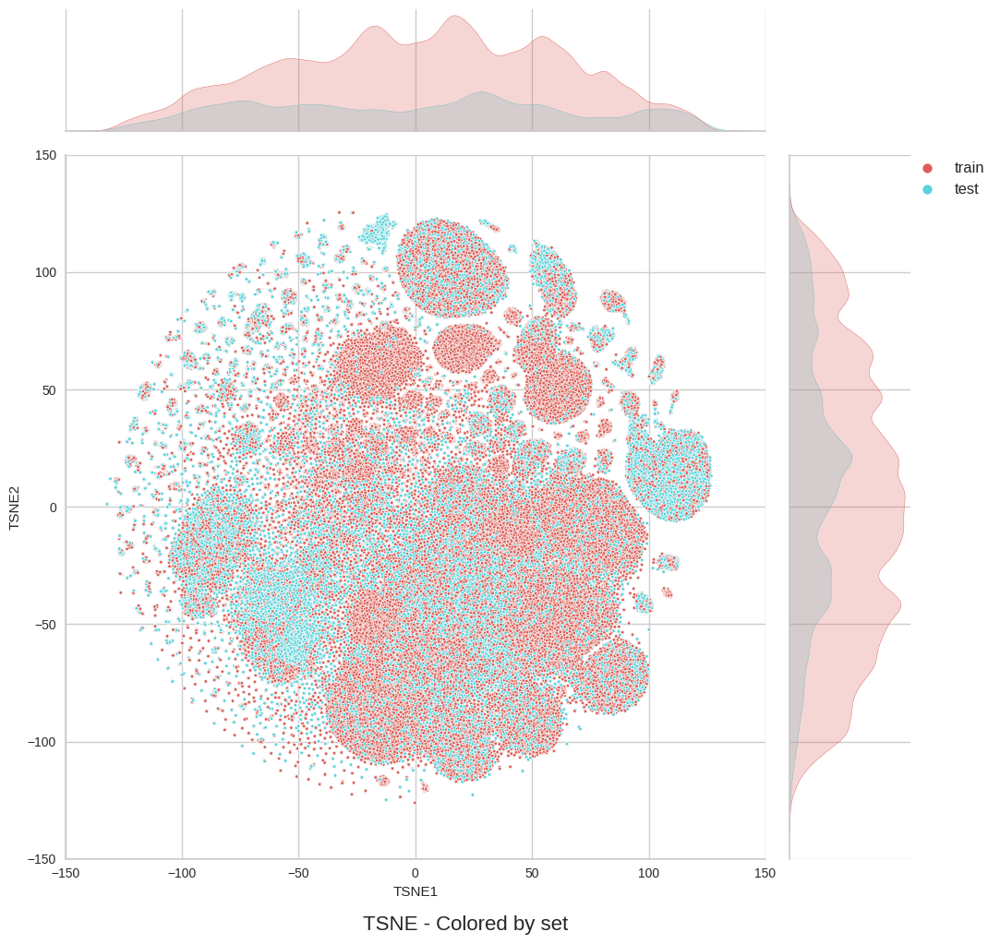

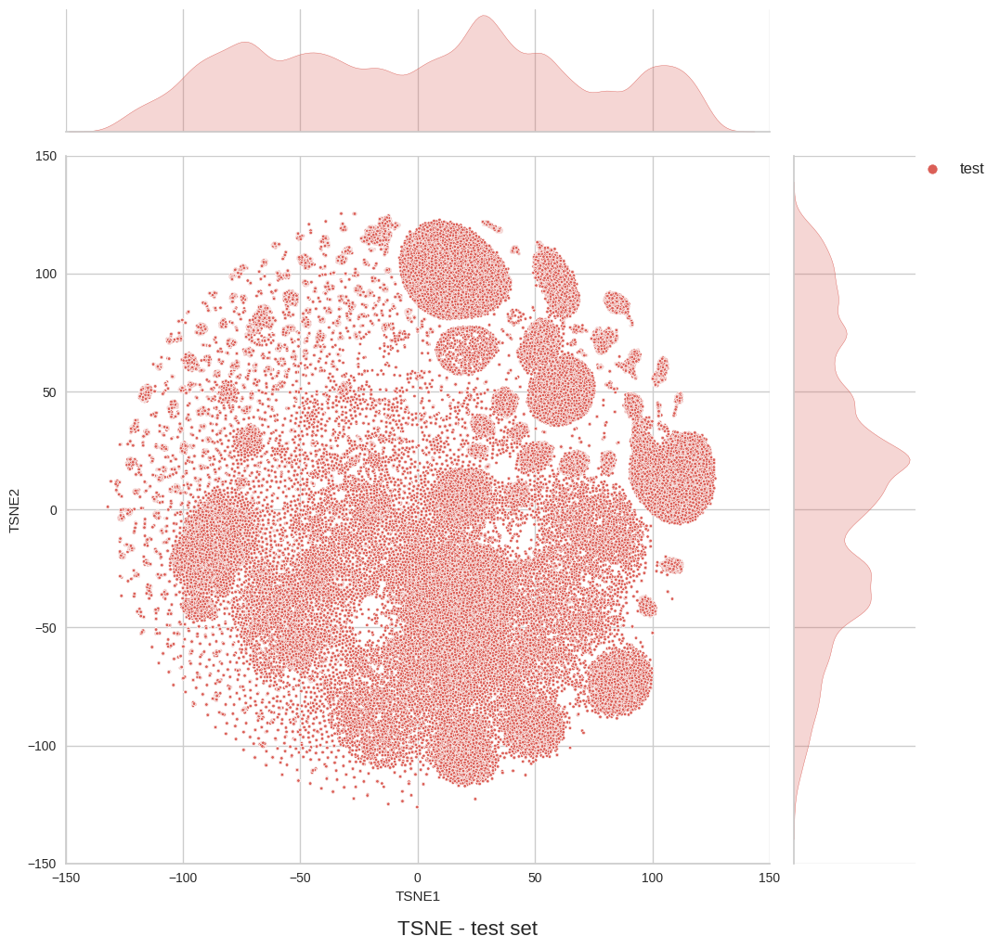

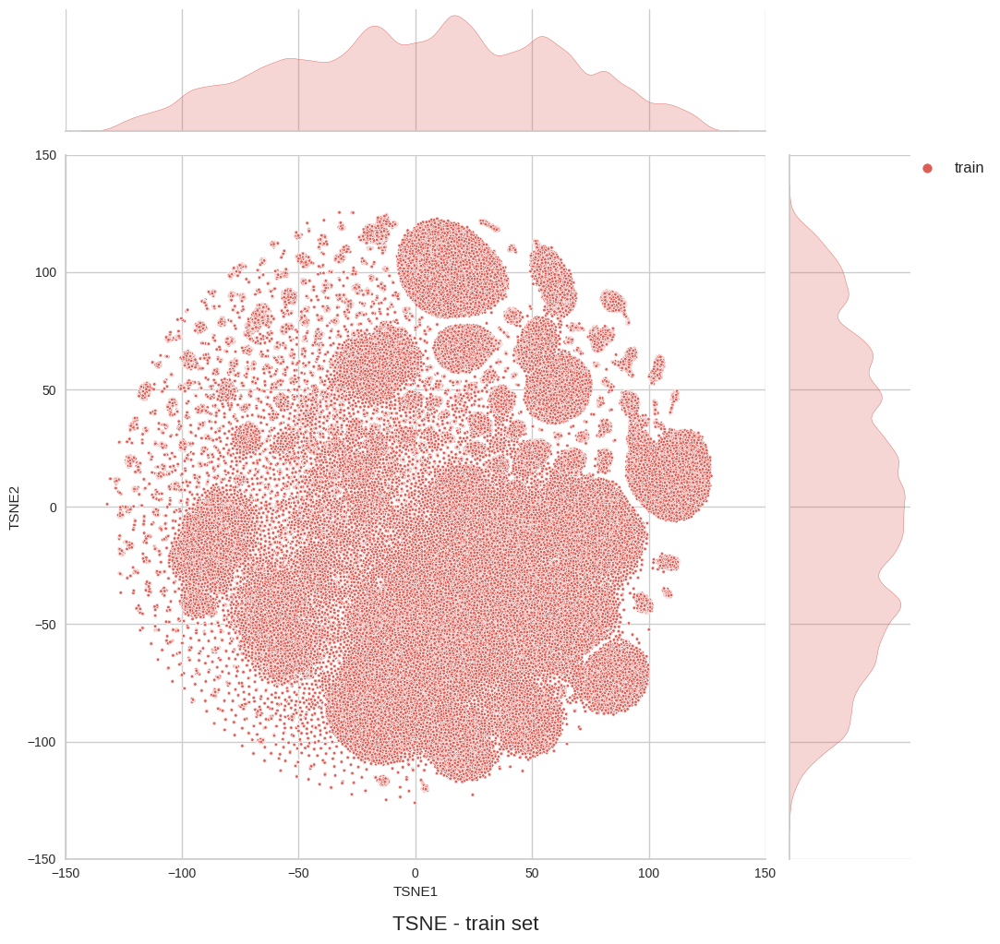

In [28]:
g = sns.jointplot(data=merged_df, x='TSNE1', y='TSNE2', hue='set', palette='hls', height=10, ratio=5, marker=".", s=25)
g.set_axis_labels('TSNE1', 'TSNE2')

# Set xlim and ylim
g.ax_joint.set_xlim(-150, 150)
g.ax_joint.set_ylim(-150, 150)

# Legend outside the plot
plt.legend(bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0., prop={'size': 12})
g.fig.suptitle('TSNE - Colored by set', y=0.0, fontsize=16)
plt.show()

# Access each group separately
for group_name, group_data in groupedx:
    g = sns.jointplot(data=group_data, x='TSNE1', y='TSNE2', hue='set', palette='hls', height=10, ratio=5, marker=".", s=25)
    g.set_axis_labels('TSNE1', 'TSNE2')

    # Set xlim and ylim
    g.ax_joint.set_xlim(-150, 150)
    g.ax_joint.set_ylim(-150, 150)
    
    # Legend outside the plot
    plt.legend(bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0., prop={'size': 12})
    g.fig.suptitle('TSNE - ' + group_name + ' set', y=0.0, fontsize=16)

    plt.show()

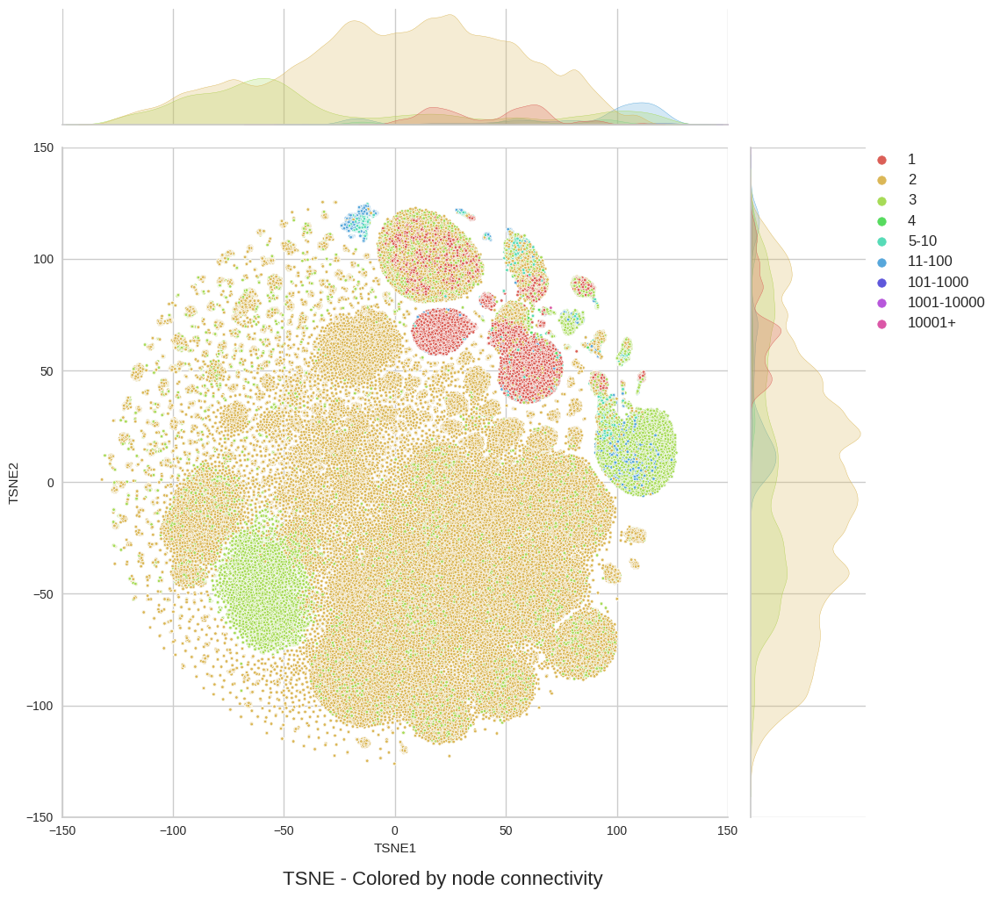

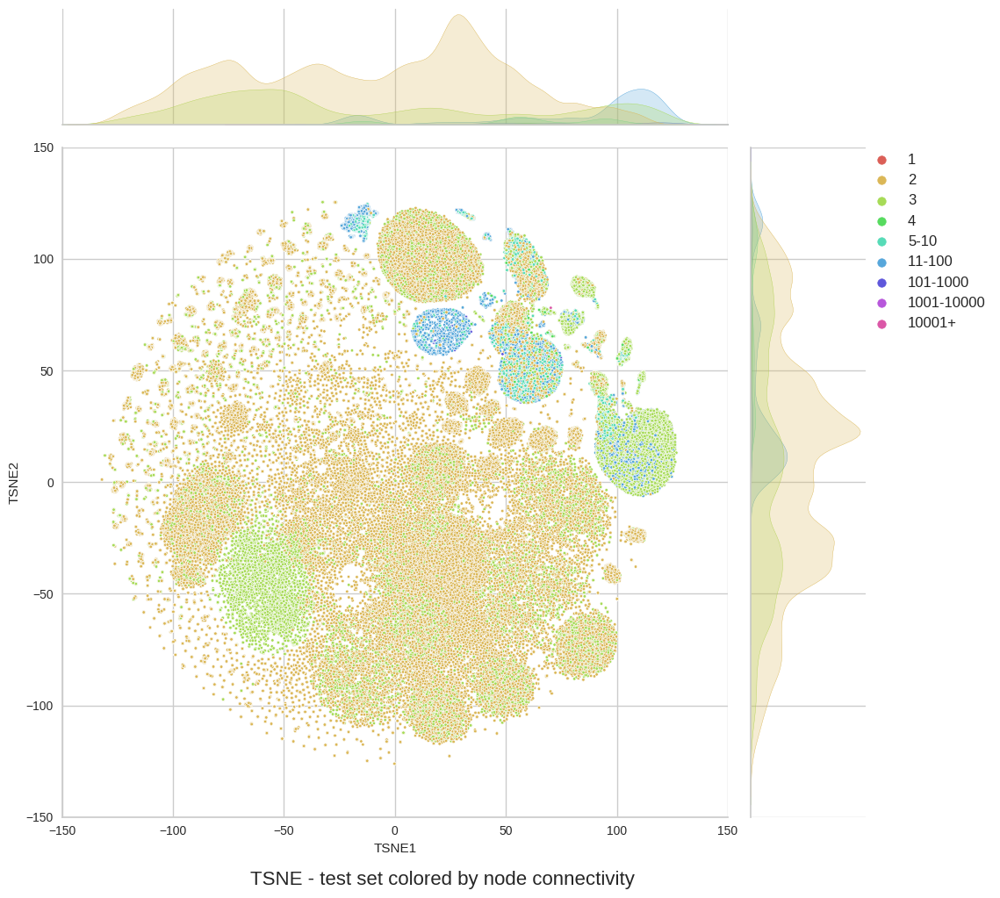

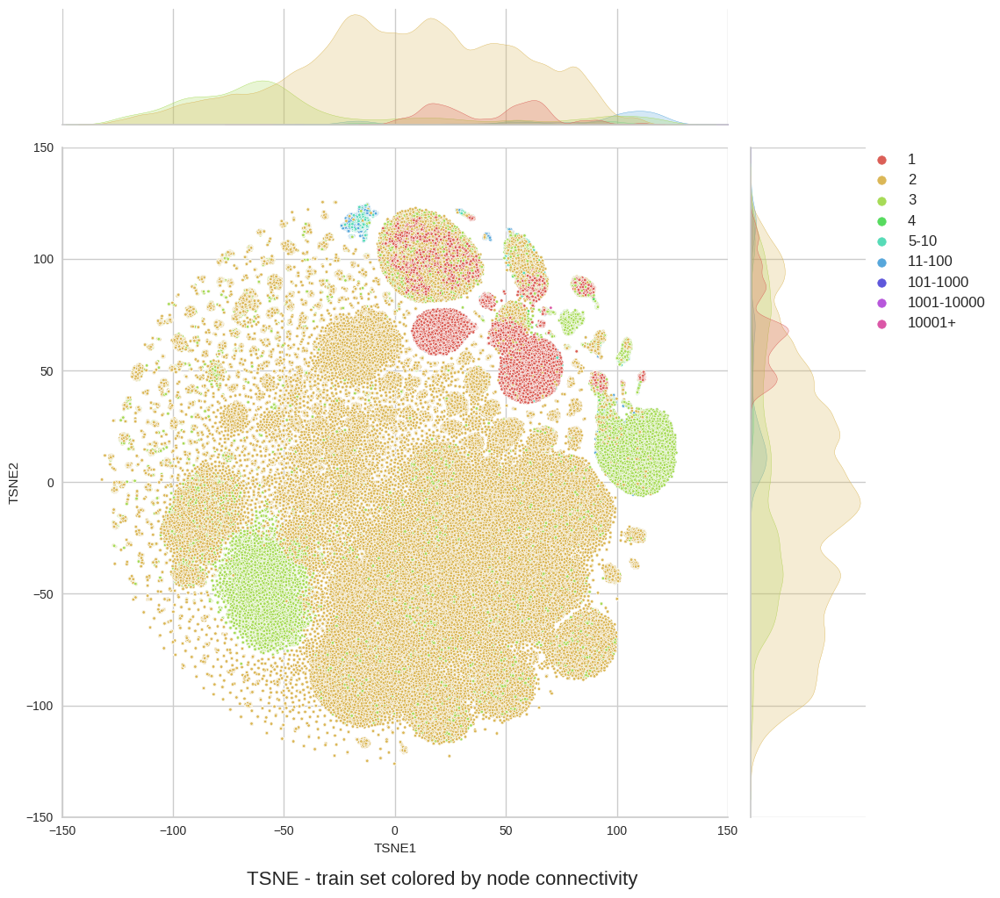

In [31]:
g = sns.jointplot(data=merged_df, x='TSNE1', y='TSNE2', hue='grouped_connectivity', palette='hls', height=10, ratio=5, marker=".", s=25)
g.set_axis_labels('TSNE1', 'TSNE2')

# Set xlim and ylim
g.ax_joint.set_xlim(-150, 150)
g.ax_joint.set_ylim(-150, 150)

# Legend outside the plot
plt.legend(bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0., prop={'size': 12})
g.fig.suptitle('TSNE - Colored by node connectivity', y=0.0, fontsize=16)
plt.show()

# Access each group separately
for group_name, group_data in groupedx:
    g = sns.jointplot(data=group_data, x='TSNE1', y='TSNE2', hue='grouped_connectivity', palette='hls', height=10, ratio=5, marker=".", s=25)
    g.set_axis_labels('TSNE1', 'TSNE2')

    # Set xlim and ylim
    g.ax_joint.set_xlim(-150, 150)
    g.ax_joint.set_ylim(-150, 150)
    
    # Legend outside the plot
    plt.legend(bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0., prop={'size': 12})
    g.fig.suptitle('TSNE - ' + group_name + ' set colored by node connectivity', y=0.0, fontsize=16)

    plt.show()

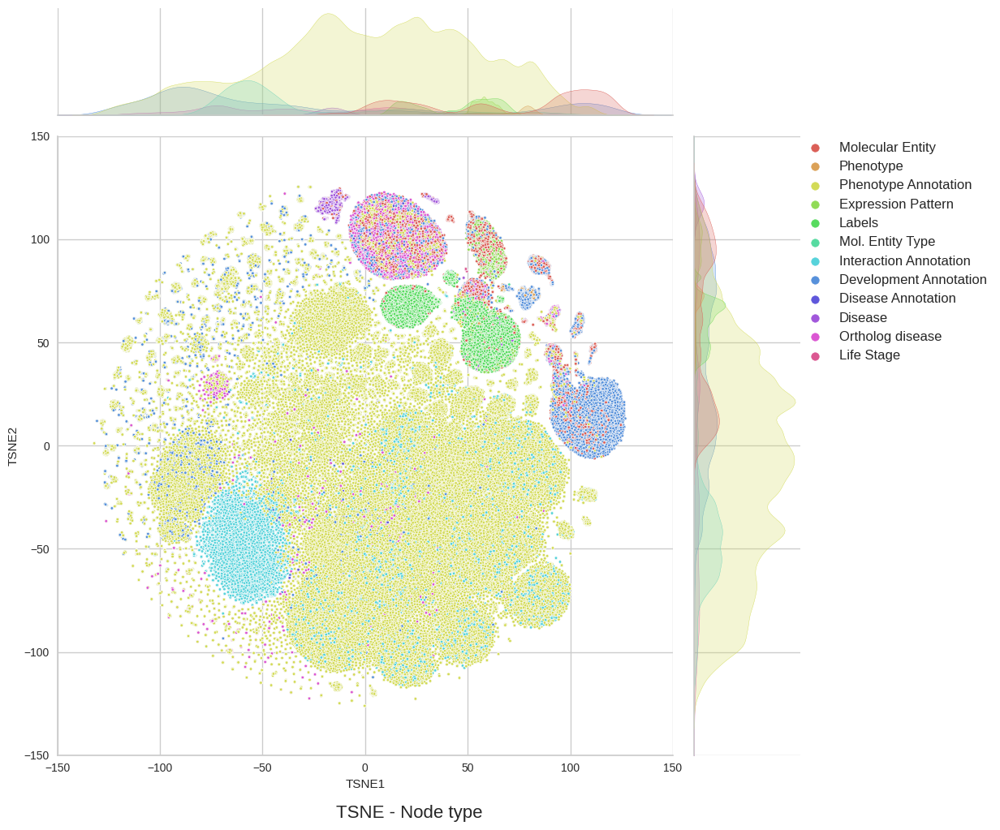

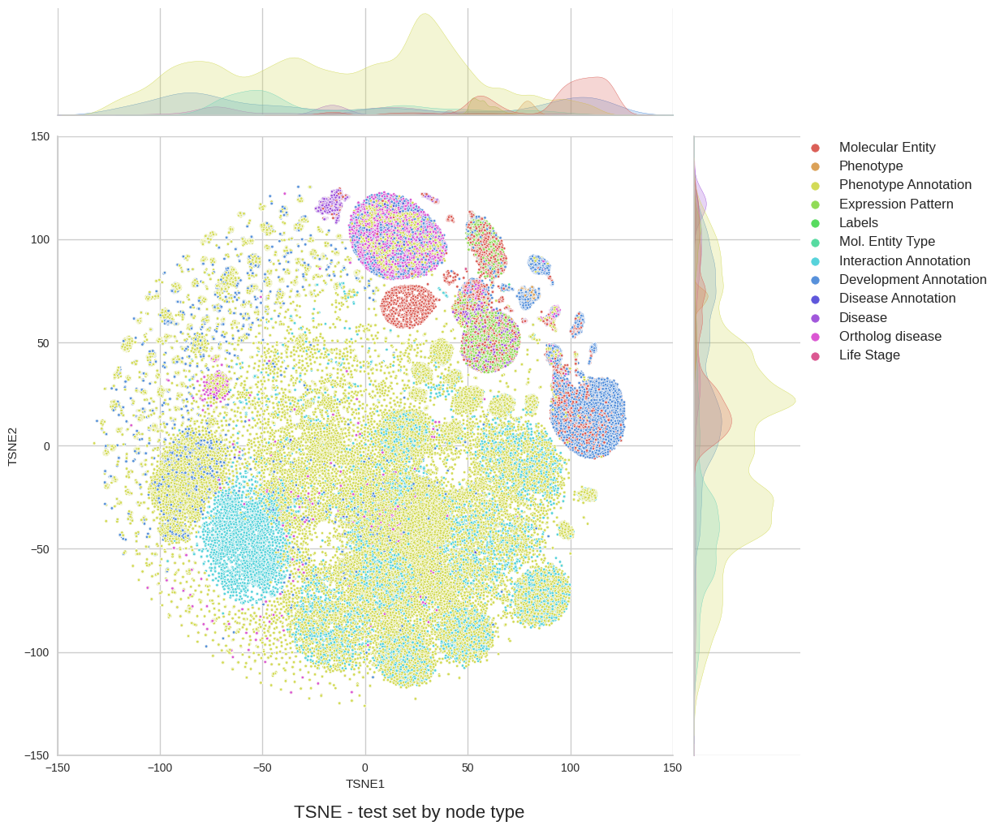

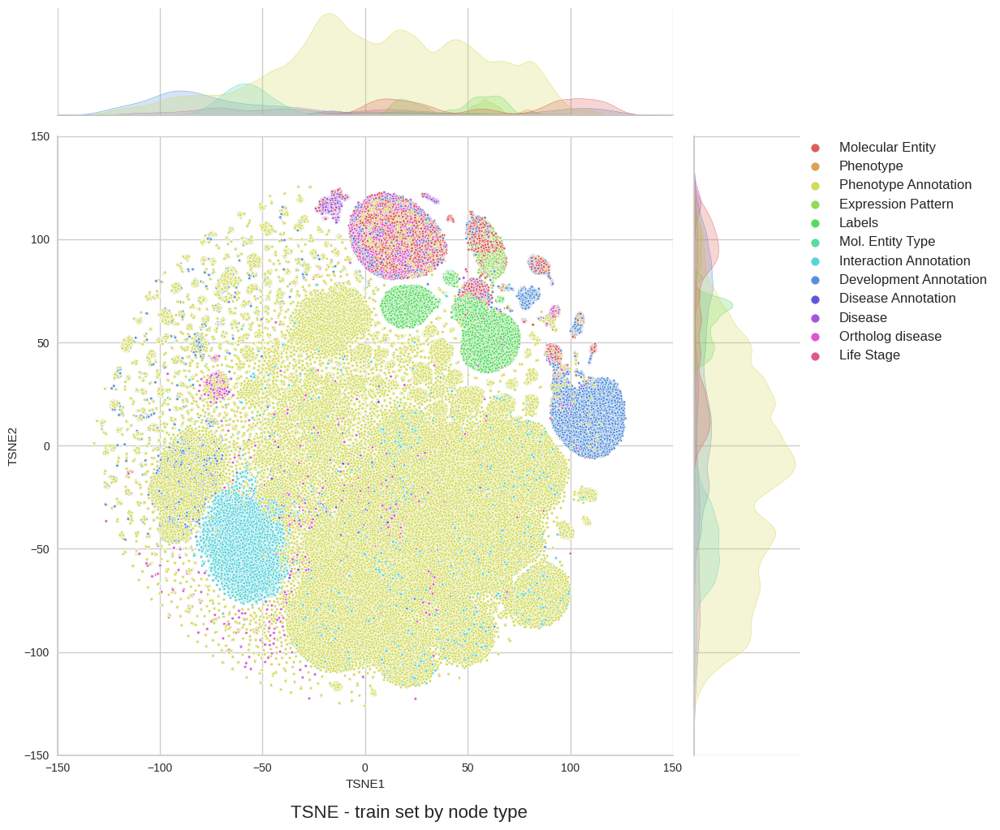

In [37]:
g = sns.jointplot(data=merged_df, x='TSNE1', y='TSNE2', hue='node_type', hue_order=replacement_dict.values(), palette='hls', height=10, ratio=5, marker=".", s=25)
g.set_axis_labels('TSNE1', 'TSNE2')

# Set xlim and ylim
g.ax_joint.set_xlim(-150, 150)
g.ax_joint.set_ylim(-150, 150)

# Legend outside the plot
plt.legend(bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0., prop={'size': 12})
g.fig.suptitle('TSNE - Node type', y=0.0, fontsize=16)
plt.show()

# Access each group separately
for group_name, group_data in groupedx:
    g = sns.jointplot(data=group_data, x='TSNE1', y='TSNE2', hue='node_type', hue_order=replacement_dict.values(), palette='hls', height=10, ratio=5, marker=".", s=25)
    g.set_axis_labels('TSNE1', 'TSNE2')

    # Set xlim and ylim
    g.ax_joint.set_xlim(-150, 150)
    g.ax_joint.set_ylim(-150, 150)
    
    # Legend outside the plot
    plt.legend(bbox_to_anchor=(1.2, 1), loc=2, borderaxespad=0., prop={'size': 12})
    g.fig.suptitle('TSNE - ' + group_name + ' set by node type', y=0.0, fontsize=16)

    plt.show()